# Geometric & Intensity Transformations


Apply classical image processing operations using Python and the `(PIL)` library. Complete both tasks and save your output images for comparison.


In [1]:
# Import the library
from PIL import Image, ImageOps
import numpy as np


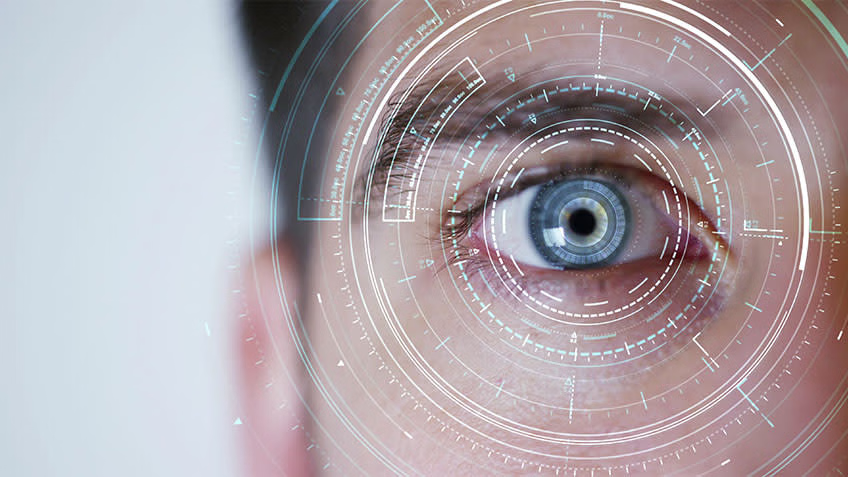

In [2]:
# ── Load image ────────────────────────────────────
img = Image.open("img.avif")
img

### 1. Scale (increase size)
Double the image dimensions using `Image.resize()` with high-quality resampling `(LANCZOS)`.

In [3]:
# Get the size of the image
width, height = img.size
print("Original size:", width, height)

# scaling factors
scale_x = 2
scale_y = 2

Original size: 848 477


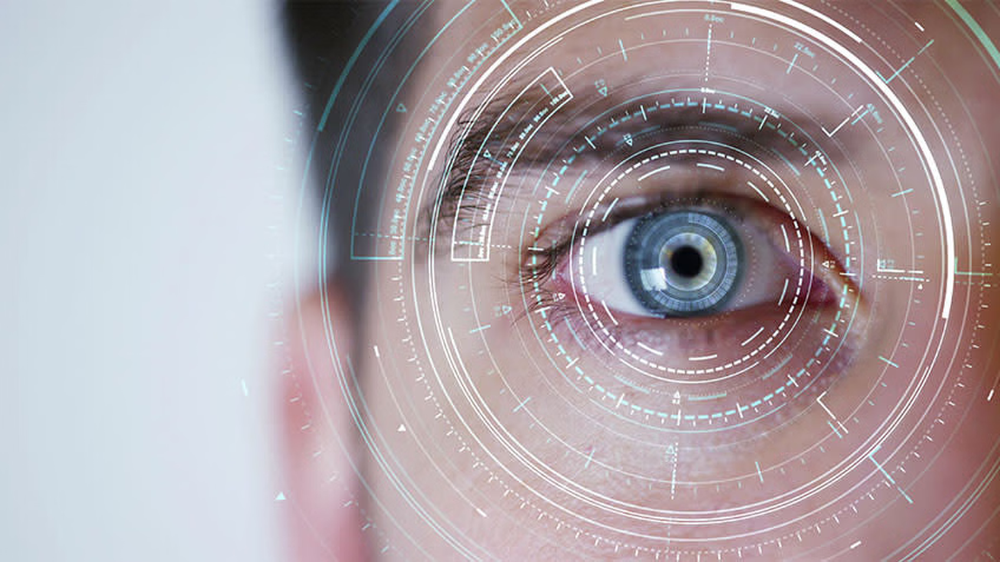

In [4]:
# ── 1. Increase size (scale ×2) ────────────────────

# Resize the image using PIL's built-in method
scaled_img = img.resize((width * scale_x, height * scale_y), Image.LANCZOS)
scaled_img


In [5]:

# Save the scaled image and print the sizes (The new image name should be "task1_1_scaled.jpg")
scaled_img.save("task1_1_scaled.jpg")
print("Original size:", img.size)
print("Scaled size:  ", scaled_img.size)

Original size: (848, 477)
Scaled size:   (1696, 954)


 non-uniform scale (cx=2, cy=1) → stretch horizontally only

In [6]:
cx, cy = 2, 1
new_size = (int(width * cx), int(height * cy))

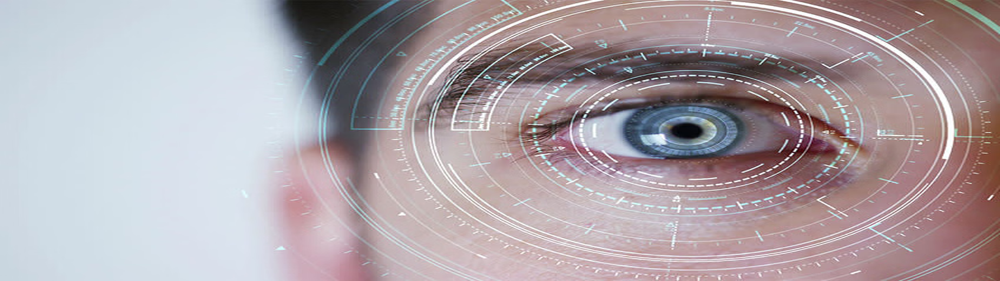

In [7]:
stretched_img = img.resize(new_size, Image.LANCZOS)
stretched_img

In [8]:
stretched_img.save("task1_1b_stretched.jpg")
print("Original size:  ", img.size)
print("Stretched size: ", stretched_img.size)

Original size:   (848, 477)
Stretched size:  (1696, 477)


### 2. Rotate 120°
Rotate the image by 120 degrees, expanding the canvas to fit the full rotated image.

Original size: (848, 477)
Rotated size:  (838, 973)


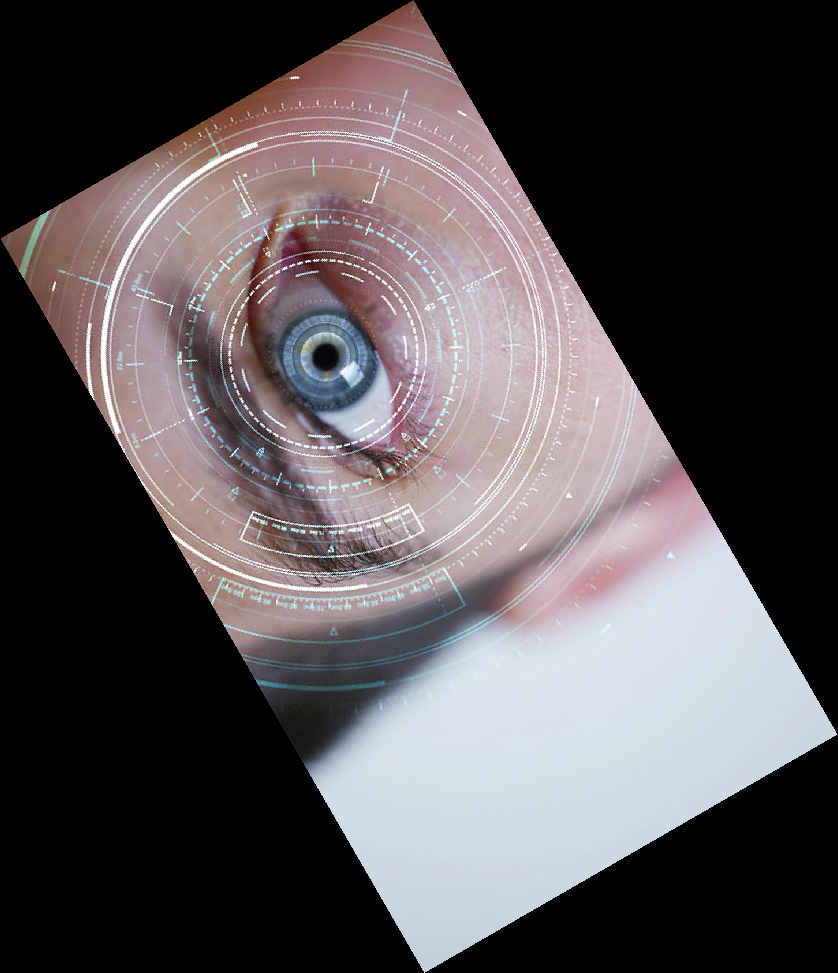

In [10]:
# ── 2. Rotate 120 degrees ──────────────────────────
rotated_img = img.rotate(120, expand=True)
# Save the scaled image and print the sizes (The new image name should be "task1_2_rotated.jpg")
rotated_img.save("task1_2_rotated.jpg")
print("Original size:", img.size)
print("Rotated size: ", rotated_img.size)
rotated_img

### 3. Shear

In [11]:
# -- c. Get the image dimensions ────────────────────
width, height = img.size

In [12]:
# -- d. define the shear matrix ──────────────────────────
shear_factor = 0.5
# Choose X-axis or Y-axis shear. The shear factor controls how much the image slants — start with 0.5 then experiment.
shx, shy = shear_factor, 0

new_width  = width + int(abs(shx) * height)
new_height = height + int(abs(shy) * width)

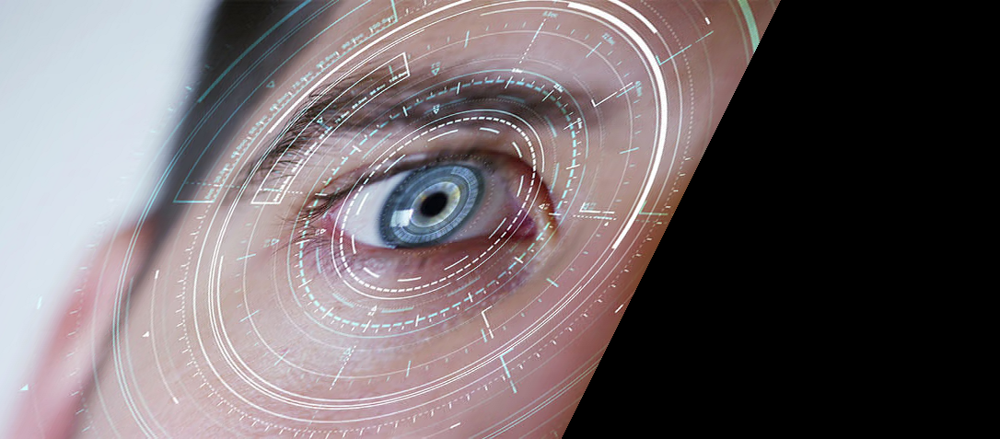

In [13]:
# -- e. Apply the shear transformation to the image ──────────────────────────
# PIL's transform() takes the inverse affine matrix:
# [ 1    shx   tx ]
# [ shy  1     ty ]

M = (1, shx, 0,
     shy, 1, 0)

sheared_img = img.transform((new_width, new_height), Image.AFFINE, M, resample=Image.BICUBIC)
sheared_img



In [14]:
# -- f. Save the sheared image(The new image name should be "task1_3_sheared.jpg")
sheared_img.save("task1_3_sheared.jpg")
print("Original size:", img.size)
print("Sheared size: ", sheared_img.size)

Original size: (848, 477)
Sheared size:  (1086, 477)


### Experiment and compare
Try these:

— Change shear factor from 0.5 to 0.1, 0.3, 0.8 and compare results

— Switch from X-axis to Y-axis shear matrix

— Update the canvas multiplier to match your new factor

— Try combining X and Y shear in one matrix

# Intensity Transformations
Negative · Log · Power Law (Gamma)

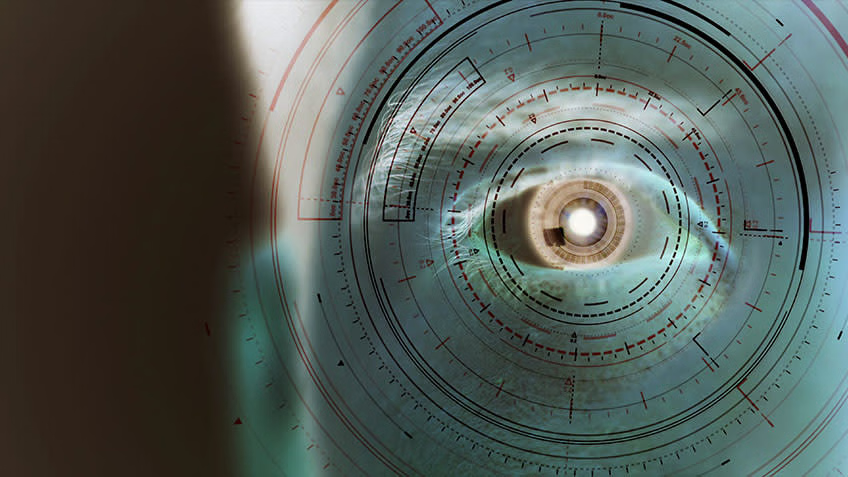

In [15]:

# ── 1. Negative ────────────────────────────────────
# Method 1: NumPy array manipulation
img_array = np.array(img)
negative_array = 255 - img_array
negative_img = Image.fromarray(negative_array.astype(np.uint8))
negative_img.save("task2_1_negative_numpy.jpg")
negative_img



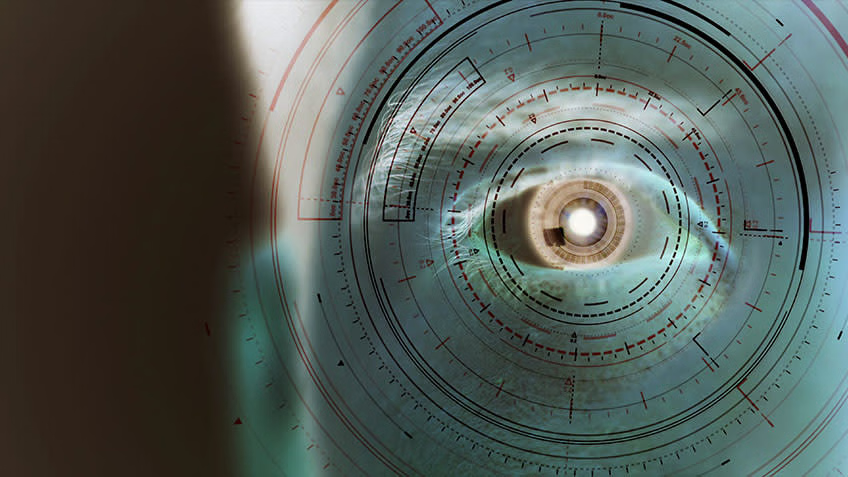

In [16]:
# Method 2: PIL's ImageOps
negative_img_pil = ImageOps.invert(img.convert("RGB"))
negative_img_pil.save("task2_1_negative_pil.jpg")
negative_img_pil

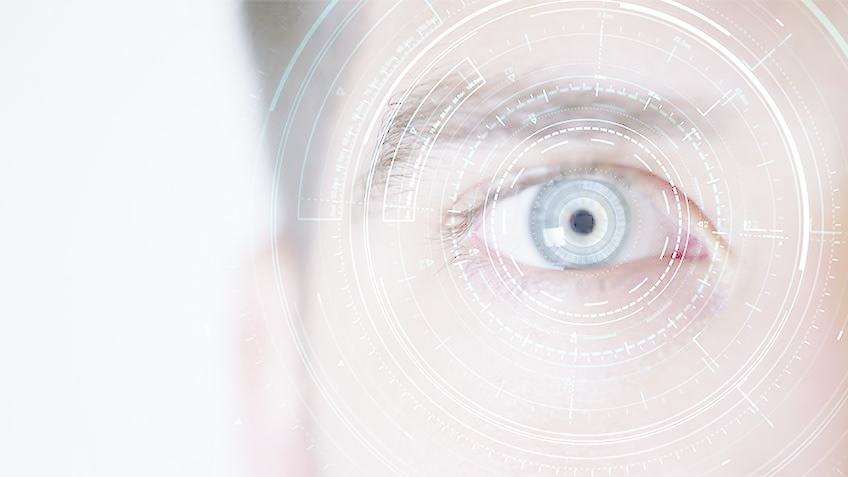

In [17]:
# ── 2. Log transformation ──────────────────────────

# s = c · log(1 + r) --> We need to find c.
# We want the maximum output value (s) to be 255 when the maximum input value (r) is 255:
# 255 = c · log(1 + 255)
c = 255 / np.log(1 + 255)

img_array = np.array(img).astype(float)
log_array = c * np.log(1 + img_array)
log_array = np.clip(log_array, 0, 255).astype(np.uint8)

log_img = Image.fromarray(log_array)
log_img.save("task2_2_log.jpg")
log_img

# Apply the log transformation to each pixel


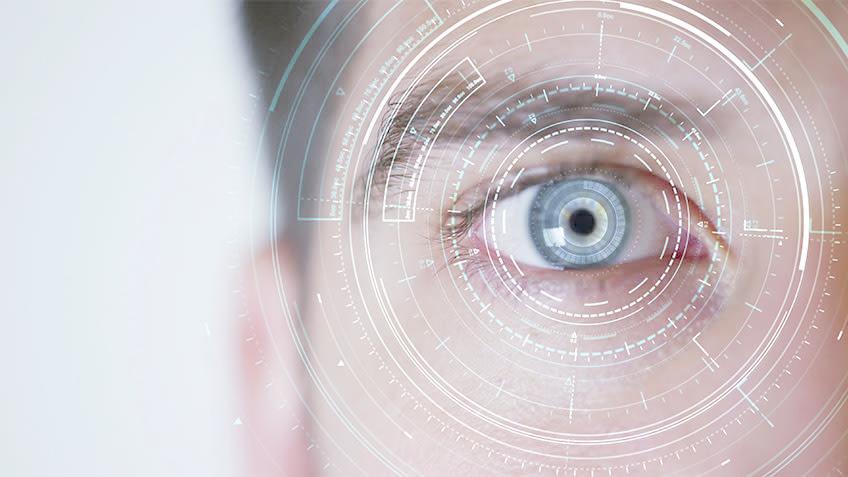

In [18]:
# ── 3. Power-law / Gamma correction ───────────────
gamma = 0.5

img_array = np.array(img).astype(float) / 255.0
gamma_array = np.power(img_array, gamma)
gamma_array = np.uint8(gamma_array * 255)

gamma_img = Image.fromarray(gamma_array)
gamma_img.save("task2_3_gamma.jpg")
gamma_img


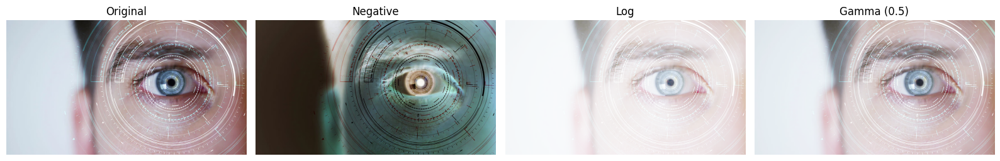

In [19]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
titles = ["Original", "Negative", "Log", "Gamma (0.5)"]
images = [img, negative_img, log_img, gamma_img]

for ax, im, title in zip(axes, images, titles):
    ax.imshow(im)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [20]:
from google.colab import files
import os

output_images = [
    "task1_1_scaled.jpg",
    "task1_1b_stretched.jpg",
    "task1_2_rotated.jpg",
    "task1_3_sheared.jpg",
    "task2_1_negative_numpy.jpg",
    "task2_1_negative_pil.jpg",
    "task2_2_log.jpg",
    "task2_3_gamma.jpg",
]

for fname in output_images:
    if os.path.exists(fname):
        files.download(fname)
    else:
        print(f"Missing: {fname}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>